# Project : E-commerce Customer Segmentation

# Dataset: cust_data(k_means)
# Method : Un-Supervised learning - k_means Clustering

# Importing the Libraries:

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Read The Data Using Pandas:

In [3]:
mydata=pd.read_excel('cust_data(k_means).xlsx')
mydata

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,LG,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft
0,1,M,7,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,F,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,3,M,7,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,4,F,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5,NaN,10,0,0,0,0,0,0,0,...,0,0,2,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,M,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29996,29997,M,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29997,29998,M,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29998,29999,M,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In the Given Data there is No Dependant variabe Present, We choose Un-Supervised Learning

# Data pre-processing including missing value treatment

# Describe the Data

In [3]:
mydata.describe()

,Cust_ID,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,Vans,...,LG,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,4.169800,0.267433,0.252333,0.222933,0.161333,0.143533,0.139767,0.106933,0.111433,...,0.102533,0.271133,0.370067,0.158967,0.077667,0.057333,0.192200,0.116367,0.088033,0.070900
std,8660.398374,3.590311,0.804778,0.705368,0.917494,0.740038,0.641258,0.525840,0.515921,0.547990,...,0.486376,0.714682,0.758465,0.510527,0.383370,0.300082,0.641306,0.446578,0.399277,0.387915
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,15000.500000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,22500.250000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,30000.000000,12.000000,24.000000,15.000000,27.000000,17.000000,14.000000,31.000000,9.000000,16.000000,...,19.000000,12.000000,11.000000,8.000000,9.000000,8.000000,22.000000,14.000000,8.000000,16.000000


# Check For Null

In [4]:
mydata.isnull().sum()

Cust_ID                      0
Gender                    2724
Orders                       0
Jordan                       0
Gatorade                     0
Samsung                      0
Asus                         0
Udis                         0
Mondelez International       0
Wrangler                     0
Vans                         0
Fila                         0
Brooks                       0
H&M                          0
Dairy Queen                  0
Fendi                        0
Hewlett Packard              0
Pladis                       0
Asics                        0
Siemens                      0
J.M. Smucker                 0
Pop Chips                    0
Juniper                      0
Huawei                       0
Compaq                       0
IBM                          0
Burberry                     0
Mi                           0
LG                           0
Dior                         0
Scabal                       0
Tommy Hilfiger               0
Holliste

Null value Present in Gender column

# Drop the Null values

In Gender column, Less null data present, Dropping the Null values Cannot affect the Dataset

In [5]:
mydata=mydata.dropna()
mydata

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,LG,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft
0,1,M,7,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,F,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,3,M,7,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,4,F,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,6,F,4,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,M,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29996,29997,M,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29997,29998,M,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29998,29999,M,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
mydata.isnull().sum()

Cust_ID                   0
Gender                    0
Orders                    0
Jordan                    0
Gatorade                  0
Samsung                   0
Asus                      0
Udis                      0
Mondelez International    0
Wrangler                  0
Vans                      0
Fila                      0
Brooks                    0
H&M                       0
Dairy Queen               0
Fendi                     0
Hewlett Packard           0
Pladis                    0
Asics                     0
Siemens                   0
J.M. Smucker              0
Pop Chips                 0
Juniper                   0
Huawei                    0
Compaq                    0
IBM                       0
Burberry                  0
Mi                        0
LG                        0
Dior                      0
Scabal                    0
Tommy Hilfiger            0
Hollister                 0
Forever 21                0
Colavita                  0
Microsoft           

Nulls Removed

# Check for the Type

In [7]:
mydata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27276 entries, 0 to 29999
Data columns (total 38 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Cust_ID                 27276 non-null  int64 
 1   Gender                  27276 non-null  object
 2   Orders                  27276 non-null  int64 
 3   Jordan                  27276 non-null  int64 
 4   Gatorade                27276 non-null  int64 
 5   Samsung                 27276 non-null  int64 
 6   Asus                    27276 non-null  int64 
 7   Udis                    27276 non-null  int64 
 8   Mondelez International  27276 non-null  int64 
 9   Wrangler                27276 non-null  int64 
 10  Vans                    27276 non-null  int64 
 11  Fila                    27276 non-null  int64 
 12  Brooks                  27276 non-null  int64 
 13  H&M                     27276 non-null  int64 
 14  Dairy Queen             27276 non-null  int64 
 15  Fe

In the Given Dataset we have Gender column in Object datatype, to convert object to integer Datatype, Label Encoder is used

# Label Encoder

Label Encoder is used to convert Object to Integerf Datatype

In [8]:
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()

In [9]:
mydata['Gender']=LE.fit_transform(mydata.Gender)

In [10]:
mydata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27276 entries, 0 to 29999
Data columns (total 38 columns):
 #   Column                  Non-Null Count  Dtype
---  ------                  --------------  -----
 0   Cust_ID                 27276 non-null  int64
 1   Gender                  27276 non-null  int32
 2   Orders                  27276 non-null  int64
 3   Jordan                  27276 non-null  int64
 4   Gatorade                27276 non-null  int64
 5   Samsung                 27276 non-null  int64
 6   Asus                    27276 non-null  int64
 7   Udis                    27276 non-null  int64
 8   Mondelez International  27276 non-null  int64
 9   Wrangler                27276 non-null  int64
 10  Vans                    27276 non-null  int64
 11  Fila                    27276 non-null  int64
 12  Brooks                  27276 non-null  int64
 13  H&M                     27276 non-null  int64
 14  Dairy Queen             27276 non-null  int64
 15  Fendi              

 Object Datatype Converted to Integer Datatype

# Univariate And Bivariate Analysis

# Correlation:

In [11]:
mydata_corr=mydata.corr()
mydata_corr

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,LG,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft
Cust_ID,1.000000,-0.065931,0.022437,0.060953,0.021677,0.056866,0.048642,0.060692,0.034219,0.039404,...,0.032658,0.062598,0.051840,0.021411,0.079315,0.048070,0.003216,-0.006147,-0.021673,0.018419
Gender,-0.065931,1.000000,0.007767,0.023041,0.125629,-0.009161,-0.102281,-0.083667,-0.049625,-0.093346,...,-0.055529,-0.079602,-0.195062,-0.072046,-0.042999,-0.050219,-0.000862,-0.015285,-0.018417,-0.005332
Orders,0.022437,0.007767,1.000000,0.009460,0.031608,0.012108,0.012807,0.005052,0.004260,-0.002218,...,-0.004749,0.006762,0.015578,0.004811,-0.000457,-0.003504,0.005378,0.012168,0.009388,-0.007967
Jordan,0.060953,0.023041,0.009460,1.000000,0.176335,0.070817,0.117573,0.133464,0.020776,0.041294,...,0.072576,0.059792,0.060782,0.065461,0.024102,0.023718,0.014968,0.013014,0.017802,0.019756
Gatorade,0.021677,0.125629,0.031608,0.176335,1.000000,0.065919,0.045438,0.056299,0.028674,0.088092,...,0.067319,0.054719,0.044266,0.057783,0.053257,0.032585,0.019157,0.012714,0.036314,0.019086
Samsung,0.056866,-0.009161,0.012108,0.070817,0.065919,1.000000,0.011594,0.028252,0.033799,0.013512,...,0.061752,0.015866,0.047126,0.018851,0.023756,0.019265,0.006795,0.003060,0.007715,0.009280
Asus,0.048642,-0.102281,0.012807,0.117573,0.045438,0.011594,1.000000,0.115779,0.017059,0.023947,...,0.027445,0.029051,0.043383,0.040833,0.014676,0.012565,0.010140,0.018776,0.007133,0.008927
Udis,0.060692,-0.083667,0.005052,0.133464,0.056299,0.028252,0.115779,1.000000,0.039548,0.022838,...,0.031320,0.028950,0.068282,0.024420,0.032582,0.037809,0.001112,0.011061,0.005040,0.009409
Mondelez International,0.034219,-0.049625,0.004260,0.020776,0.028674,0.033799,0.017059,0.039548,1.000000,0.020544,...,0.038356,0.034381,0.098828,0.055103,0.037344,0.045048,0.015721,0.012579,0.025913,0.022074
Wrangler,0.039404,-0.093346,-0.002218,0.041294,0.088092,0.013512,0.023947,0.022838,0.020544,1.000000,...,0.082595,0.056858,0.102435,0.042951,0.074573,0.063410,0.006320,0.005414,0.015195,0.015939


# correlogram

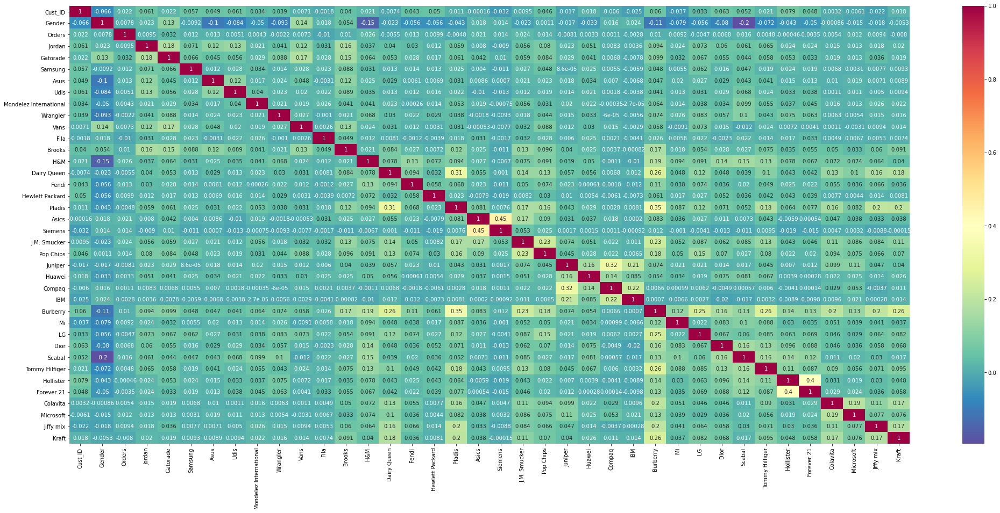

In [21]:
plt.figure(figsize=(35,15))
sns.heatmap(mydata_corr,annot=True,cmap='Spectral_r')
plt.show()

# Visualization:

# Graph 1 : HistoGram

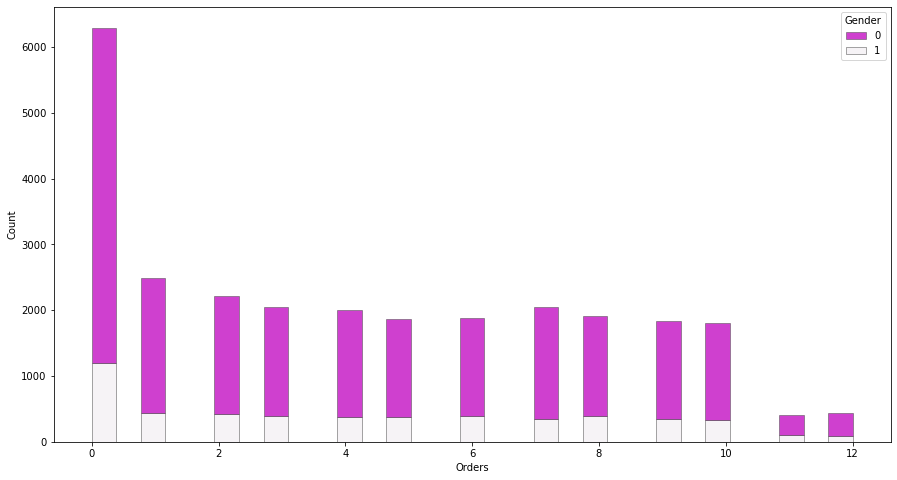

In [23]:
plt.figure(figsize=(15,8))
sns.histplot(mydata,x="Orders", hue="Gender",multiple="stack",palette="light:m_r",edgecolor=".3",linewidth=.5)
plt.show()

# Graph 2 : Scatter Plot

In [4]:
import plotly.express as px

fig = px.scatter(mydata, x="Cust_ID",y="IBM", title='Customers Buyed IBM')
fig.show()

In [5]:
import plotly.express as px

fig = px.scatter(mydata, x="Cust_ID",y="LG", title='Customers Buyed LG')
fig.show()

# Graph 3 : Density Plot

In [6]:
fig = px.density_heatmap(mydata, x="Cust_ID", y="Orders")
fig.show()

# Graph 4: 3d_Scatter Plot

In [7]:
import plotly.express as px

fig = px.scatter_3d(mydata, x='Tommy Hilfiger', y='Wrangler', z='Dairy Queen',
              color='Orders')
fig.show()

# Graph 5 : JointPlot

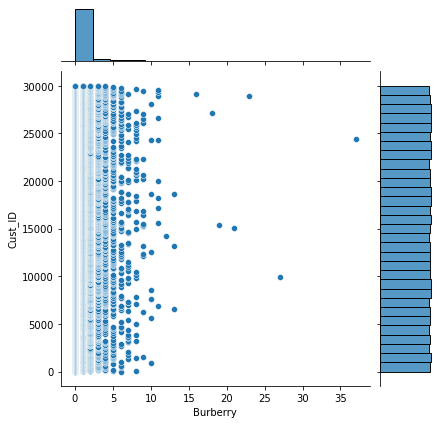

In [91]:
sns.jointplot(x="Burberry",y='Cust_ID',data=mydata);

# Graph 6: Barplot is used

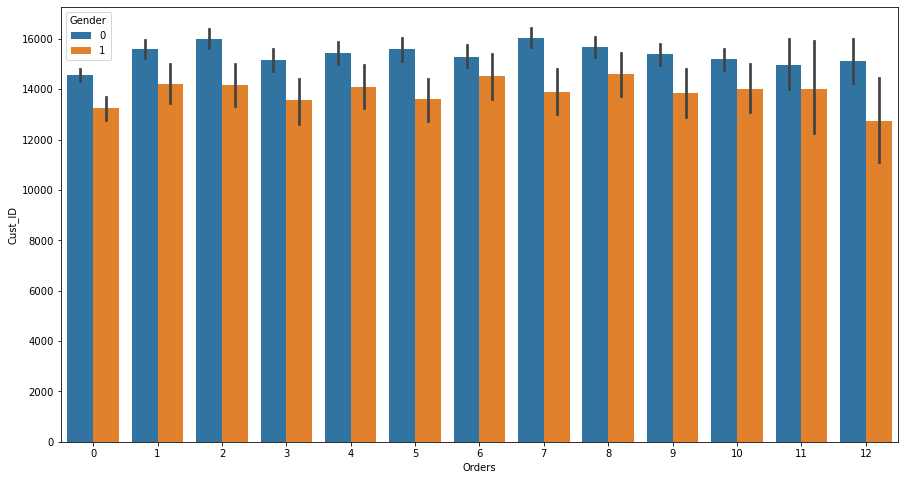

In [99]:
plt.figure(figsize=(15,8))
sns.barplot(x='Orders',y='Cust_ID',hue='Gender',data=mydata);
plt.show()

# Segmenting customer based on the optimum number of clusters (‘k’) with the help of silhouette score

# Train k_means Clustering

In [16]:
from sklearn.cluster import KMeans

# Build the Model

In [17]:
Km_cluster=KMeans(10)

# Fit the Model

In [18]:
Km_cluster.fit(mydata)

KMeans(n_clusters=10)

# Create a Copy 

In [19]:
my_Cluster=mydata.copy()

# Create a Column and Load the Predicted Values

In [20]:
my_Cluster['KM_Group']=Km_cluster.predict(my_Cluster)

In [21]:
my_Cluster

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft,KM_Group
0,1,1,7,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,7
1,2,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,7
2,3,1,7,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,7
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,7
5,6,0,4,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,6
29996,29997,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,6
29997,29998,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,6
29998,29999,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,6


# Normalize the Data

In [22]:
from sklearn.preprocessing import normalize

In [23]:
x_scaled=normalize(mydata)
x_scaled

array([[1.34839972e-01, 1.34839972e-01, 9.43879807e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [2.42535625e-01, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [3.69274473e-01, 1.23091491e-01, 8.61640437e-01, ...,
        1.23091491e-01, 0.00000000e+00, 0.00000000e+00],
       ...,
       [9.99999998e-01, 3.33355556e-05, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [9.99999999e-01, 3.33344444e-05, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [9.99999990e-01, 0.00000000e+00, 9.99999990e-05, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

<AxesSubplot:ylabel='Density'>

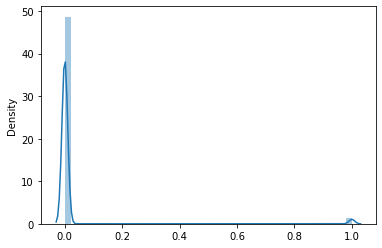

In [24]:
sns.distplot(x_scaled)

# Elbow Method

To find optimum number of Group

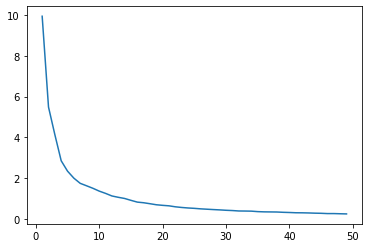

In [25]:
a=[]
for i in range(1,50):
    kmeans_em=KMeans(i)
    kmeans_em.fit(x_scaled)
    a.append(kmeans_em.inertia_)
plt.plot(range(1,50),a)

# Silhouette analysis

In [194]:
from sklearn.metrics import silhouette_score

for i in range(2,15):
    kmeans = KMeans(n_clusters=i, max_iter=50)
    kmeans.fit(x_scaled)
    cluster_labels = kmeans.labels_
    silhouette_avg = silhouette_score(x_scaled, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(i, silhouette_avg))

For n_clusters=2, the silhouette score is 0.9967972202204394
For n_clusters=3, the silhouette score is 0.9893859972792315
For n_clusters=4, the silhouette score is 0.9894212614767445
For n_clusters=5, the silhouette score is 0.9888785073958501
For n_clusters=6, the silhouette score is 0.9889636480317331
For n_clusters=7, the silhouette score is 0.9740405605081013
For n_clusters=8, the silhouette score is 0.9754050082504385
For n_clusters=9, the silhouette score is 0.9738307694076791
For n_clusters=10, the silhouette score is 0.9738333711890251
For n_clusters=11, the silhouette score is 0.9683288884171581
For n_clusters=12, the silhouette score is 0.9584338353493683
For n_clusters=13, the silhouette score is 0.9692828199876058
For n_clusters=14, the silhouette score is 0.9666949515338247


# By checking the Graph the final Model is k=6

In [26]:
Km_cluster_em=KMeans(6)

# Fit

In [27]:
Km_cluster_em.fit(x_scaled)

KMeans(n_clusters=6)

# Create a copy

In [28]:
my_Cluster_new=mydata.copy()

# Create a Column and Load the Predicted Values

In [29]:
my_Cluster_new['KM_Elbow']=Km_cluster_em.predict(x_scaled)

In [30]:
my_Cluster_new

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft,KM_Elbow
0,1,1,7,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
1,2,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,2
2,3,1,7,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,4
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,6,0,4,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29996,29997,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29997,29998,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29998,29999,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# Visualization of Group created by Elbow Method

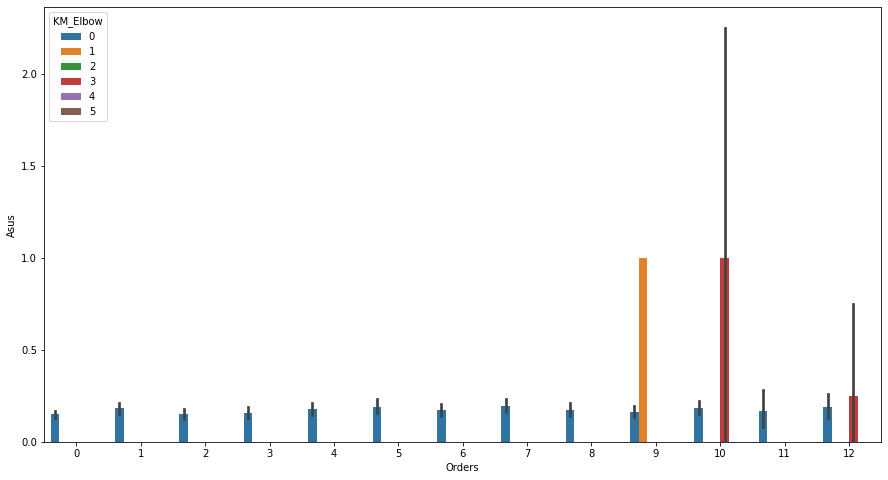

In [43]:
plt.figure(figsize=(15,8))
sns.barplot(x='Orders',y='Asus',hue='KM_Elbow',data=my_Cluster_new);
plt.show()

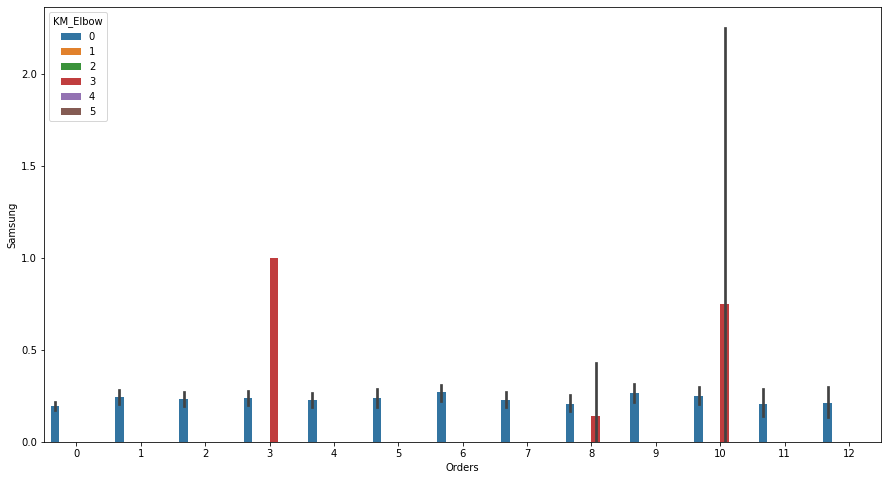

In [41]:
plt.figure(figsize=(15,8))
sns.barplot(x='Orders',y='Samsung',hue='KM_Elbow',data=my_Cluster_new);
plt.show()

<AxesSubplot:xlabel='Orders', ylabel='Cust_ID'>

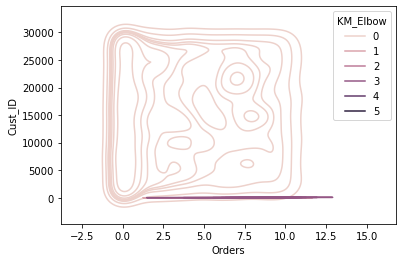

In [57]:
sns.kdeplot(data=my_Cluster_new,x="Orders",y="Cust_ID",hue='KM_Elbow',thresh=.1)

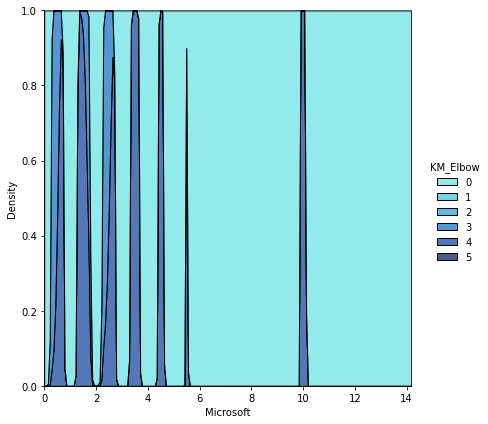

In [78]:
sns.displot(data=my_Cluster_new,x="Microsoft", hue="KM_Elbow",kind="kde", height=6,multiple="fill", clip=(0, None),palette="ch:rot=-.25,hue=2,light=.75")

# Seperating Independant and Dependant Datas

Independant

In [80]:
x_ind=my_Cluster_new.drop('KM_Elbow',axis=1)

Dependant

In [82]:
y_dep=my_Cluster_new.KM_Elbow

# Split for Train and Test Data

In [84]:
from sklearn.model_selection import train_test_split

In [86]:
x_train1,x_test1,y_train1,y_test1=train_test_split(x_ind,y_dep,test_size=0.2,random_state=1)

# Train Random Forest Classifier

In [87]:
from sklearn.ensemble import RandomForestClassifier

# Build the Model

In [88]:
model_RF=RandomForestClassifier(random_state=2)

# Fit the Model

In [89]:
model_RF.fit(x_train1,y_train1)

RandomForestClassifier(random_state=2)

# Machine Predicted

In [90]:
y_pred_RF=model_RF.predict(x_test1)

# Confusion Matrix

In [93]:
from sklearn.metrics import confusion_matrix

In [94]:
confusion_matrix(y_test1,y_pred_RF)

array([[5445,    0,    0,    0],
       [   2,    6,    0,    0],
       [   0,    2,    0,    0],
       [   1,    0,    0,    0]], dtype=int64)

# Accuracy Score

In [95]:
from sklearn.metrics import accuracy_score

In [96]:
accuracy_score(y_test1,y_pred_RF)

0.9990835777126099

# Classification Report

In [97]:
from sklearn.metrics import classification_report

In [98]:
report=classification_report(y_test1,y_pred_RF)

In [100]:
print(report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5445
           3       0.75      0.75      0.75         8
           4       0.00      0.00      0.00         2
           5       0.00      0.00      0.00         1

    accuracy                           1.00      5456
   macro avg       0.44      0.44      0.44      5456
weighted avg       1.00      1.00      1.00      5456



# Conclusion

# K_means Clustering Elbow Method - 6 groups

# E-commerce Customer Segmentation Dataset is trained by using K-Means Clustering Technique, There are six groups that seperates the independant variables are determined by using Elbow method and the model fit is executed by using Random forest Classifier Technique with an Accuracy of 0.9990835777126099
    